In [1]:
# Projet ParisHousingClass


### Link Google Colab notebook to drive folder. 

In order to read the data file from your drive, make sure you are in the correct directory. You can change the path using the os.chdir command.  

In [2]:
#import os 
#from google.colab import drive
#drive.mount('/content/drive', force_remount = True)
#os.chdir('drive/MyDrive/') #main folder of Google Drive account

### Import Libraries

**Import the libraries you usually use for data analysis.**

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [4]:
### Get the Data
##Read in the "ParisHousingClass" file using read_csv.**

In [5]:
df = pd.read_csv('DataSet/ParisHousingClass.csv', header=0)

**Check the head of the data**

In [6]:
df.head();

print(df.head());

   squareMeters  numberOfRooms  hasYard  hasPool  floors  cityCode  \
0         75523              3        0        1      63      9373   
1         80771             39        1        1      98     39381   
2         55712             58        0        1      19     34457   
3         32316             47        0        0       6     27939   
4         70429             19        1        1      90     38045   

   cityPartRange  numPrevOwners  made  isNewBuilt  hasStormProtector  \
0              3              8  2005           0                  1   
1              8              6  2015           1                  0   
2              6              8  2021           0                  0   
3             10              4  2012           0                  1   
4              3              7  1990           1                  0   

   basement  attic  garage  hasStorageRoom  hasGuestRoom      price category  
0      4313   9005     956               0             7  7559081.5

**Check the info() and describe() methods on the data**

In [7]:
print(df.info());

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   squareMeters       10000 non-null  int64  
 1   numberOfRooms      10000 non-null  int64  
 2   hasYard            10000 non-null  int64  
 3   hasPool            10000 non-null  int64  
 4   floors             10000 non-null  int64  
 5   cityCode           10000 non-null  int64  
 6   cityPartRange      10000 non-null  int64  
 7   numPrevOwners      10000 non-null  int64  
 8   made               10000 non-null  int64  
 9   isNewBuilt         10000 non-null  int64  
 10  hasStormProtector  10000 non-null  int64  
 11  basement           10000 non-null  int64  
 12  attic              10000 non-null  int64  
 13  garage             10000 non-null  int64  
 14  hasStorageRoom     10000 non-null  int64  
 15  hasGuestRoom       10000 non-null  int64  
 16  price              1000

In [8]:
print(df.describe());

       squareMeters  numberOfRooms       hasYard       hasPool        floors  \
count   10000.00000   10000.000000  10000.000000  10000.000000  10000.000000   
mean    49870.13120      50.358400      0.508700      0.496800     50.276300   
std     28774.37535      28.816696      0.499949      0.500015     28.889171   
min        89.00000       1.000000      0.000000      0.000000      1.000000   
25%     25098.50000      25.000000      0.000000      0.000000     25.000000   
50%     50105.50000      50.000000      1.000000      0.000000     50.000000   
75%     74609.75000      75.000000      1.000000      1.000000     76.000000   
max     99999.00000     100.000000      1.000000      1.000000    100.000000   

           cityCode  cityPartRange  numPrevOwners         made    isNewBuilt  \
count  10000.000000   10000.000000   10000.000000  10000.00000  10000.000000   
mean   50225.486100       5.510100       5.521700   2005.48850      0.499100   
std    29006.675799       2.872024     

### Data Preparation

In [9]:
# Separate the labels from the variables
# Separate the labels (class) from the variables
# on veut prédire la variable "hasYard" en fonction des autres variables
df_v2 = df.drop("category",axis=1);


print(df_v2.info());

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   squareMeters       10000 non-null  int64  
 1   numberOfRooms      10000 non-null  int64  
 2   hasYard            10000 non-null  int64  
 3   hasPool            10000 non-null  int64  
 4   floors             10000 non-null  int64  
 5   cityCode           10000 non-null  int64  
 6   cityPartRange      10000 non-null  int64  
 7   numPrevOwners      10000 non-null  int64  
 8   made               10000 non-null  int64  
 9   isNewBuilt         10000 non-null  int64  
 10  hasStormProtector  10000 non-null  int64  
 11  basement           10000 non-null  int64  
 12  attic              10000 non-null  int64  
 13  garage             10000 non-null  int64  
 14  hasStorageRoom     10000 non-null  int64  
 15  hasGuestRoom       10000 non-null  int64  
 16  price              1000

In [10]:
from sklearn.impute import SimpleImputer 

# Step 1: separate the numerical and nominal attributes (you should get two diffrent datasets)
# The nominal attributes are: "rbc","pc","pcc","ba","htn","dm", "cad", "appet", "pe", "ane"

# Car nous n'avons que des valeurs numériques, nous pouvons passer cette étape 

In [11]:

# Remplace toutes les valeurs nulles par la médiane  (on aurait pu utiliser la moyenne)  et normalise les données entre 0 et 1 (MinMaxScaler)
# Evite de poluer les données avec des valeurs nulles

# Step 2: Replace missing values of numerical dataset with a median (or means, zeros, etc.)
from sklearn.preprocessing import MinMaxScaler, StandardScaler
# Step 2.a: fit the imputer instance to the data
missing_values = df_v2.isnull().sum()
imputer = SimpleImputer(missing_values= np.nan , strategy='mean')
df_numeric_traite = pd.DataFrame (imputer.fit_transform(df_v2), columns=df_v2.columns)
# Step 2.b: Transform the dataset by replacing the missing values
imputer.fit(df_numeric_traite)

# Normaliser les données
# 1. Min-Max Normalization using scikit-learn
min_max_scaler = MinMaxScaler()
df_numeric_traite = pd.DataFrame(min_max_scaler.fit_transform(df_numeric_traite), columns=df_numeric_traite.columns)

df_numeric_traite



,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price
0,0.755020,0.020202,0.0,1.0,0.626263,0.093747,0.222222,0.777778,0.483871,0.0,1.0,0.4313,0.900490,0.951111,0.0,0.7,0.755144
1,0.807547,0.383838,1.0,1.0,0.979798,0.393977,0.777778,0.555556,0.806452,1.0,0.0,0.3653,0.243524,0.031111,1.0,0.2,0.807854
2,0.556731,0.575758,0.0,1.0,0.181818,0.344712,0.555556,0.777778,1.000000,0.0,0.0,0.2937,0.885189,0.038889,1.0,0.9,0.556630
3,0.322560,0.464646,0.0,0.0,0.050505,0.279500,1.000000,0.333333,0.709677,0.0,1.0,0.0659,0.714071,0.287778,0.0,0.3,0.322339
4,0.704034,0.181818,1.0,1.0,0.898990,0.380610,0.222222,0.666667,0.000000,1.0,0.0,0.8435,0.242824,0.213333,1.0,0.4,0.704723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.016385,0.888889,0.0,1.0,0.040404,0.731666,0.666667,0.555556,0.612903,0.0,1.0,0.9311,0.169717,0.131111,0.0,0.4,0.016617
9996,0.443539,0.282828,1.0,1.0,0.111111,0.346203,0.888889,0.333333,0.000000,0.0,1.0,0.9061,0.174117,0.144444,0.0,0.0,0.443973
9997,0.838274,0.020202,0.0,0.0,0.686869,0.809705,1.000000,1.000000,0.483871,1.0,1.0,0.8304,0.772977,0.272222,1.0,0.9,0.838269
9998,0.590001,0.696970,0.0,0.0,0.959596,0.558809,0.000000,0.222222,0.645161,0.0,1.0,0.2590,0.617362,0.265556,1.0,0.4,0.589688


**Use the info function to make sure the imputer function worked**

In [12]:
df_numeric_traite.info()

# Comme on peut le voir dans le résultat, toutes les colonnes sont non_null donc la fonction imputer a bien fonctionné 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   squareMeters       10000 non-null  float64
 1   numberOfRooms      10000 non-null  float64
 2   hasYard            10000 non-null  float64
 3   hasPool            10000 non-null  float64
 4   floors             10000 non-null  float64
 5   cityCode           10000 non-null  float64
 6   cityPartRange      10000 non-null  float64
 7   numPrevOwners      10000 non-null  float64
 8   made               10000 non-null  float64
 9   isNewBuilt         10000 non-null  float64
 10  hasStormProtector  10000 non-null  float64
 11  basement           10000 non-null  float64
 12  attic              10000 non-null  float64
 13  garage             10000 non-null  float64
 14  hasStorageRoom     10000 non-null  float64
 15  hasGuestRoom       10000 non-null  float64
 16  price              1000

**Merge the numerical and categorical datasets to get the complete preprocessed dataset in a single dataframe.**

In [93]:
df_traite = df_numeric_traite;

### Save final preprocessed dataset

In [16]:
df_traite.to_csv('Td1_projet.csv',index=False)

### K-means model

**Create an instance of a K means model with two clusters**

In [17]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2)


**Fit the model to all data except for the class label** 

In [18]:
kmeans.fit(df_traite)

KMeans(n_clusters=2)

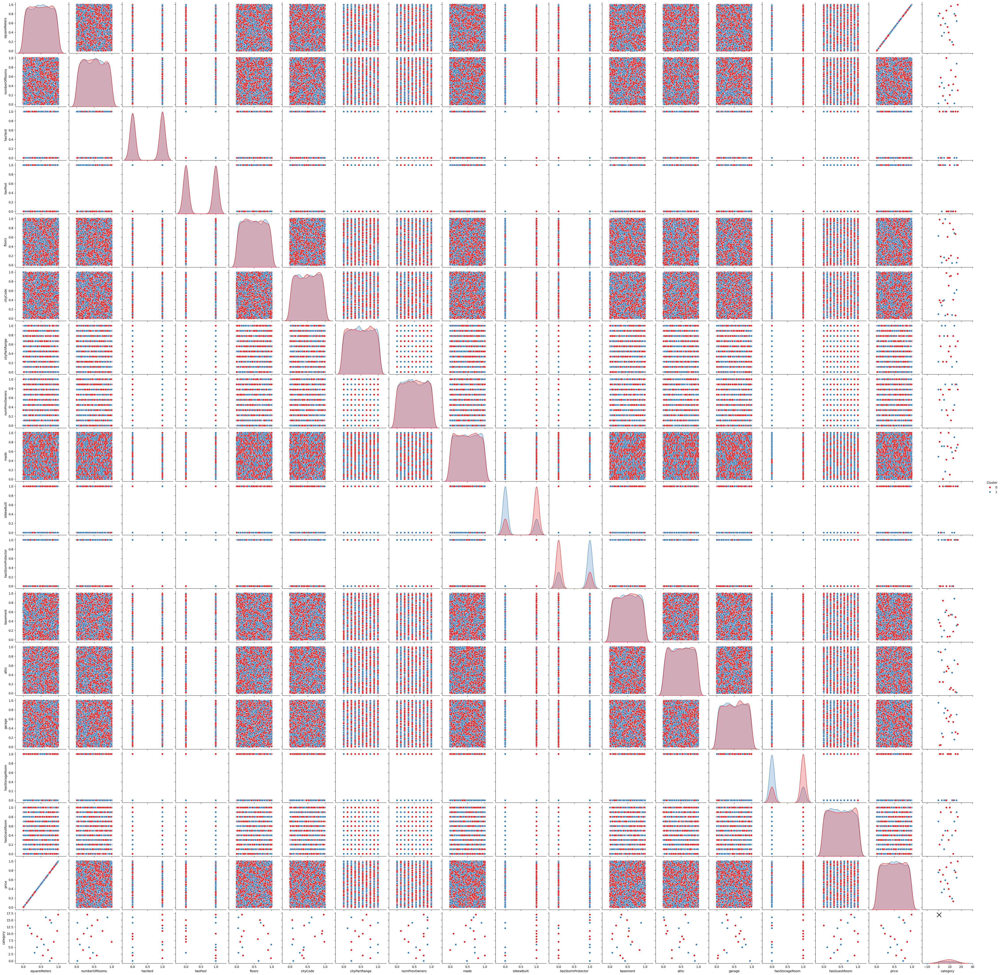

In [94]:

#KMeans(n_clusters=2) 
#chaque cluster est représenté par un point, le centre du cluster
#on peut visualiser les centres des clusters
cluster_centers = kmeans.cluster_centers_

# Add cluster assignments to the DataFrame
df_traite['Cluster'] = kmeans.labels_

sns.pairplot(df_traite, hue='Cluster' , palette='Set1')
# Plot cluster centers
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='x', s=100, c='k')
plt.show()

In [20]:
df_traite

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price,Cluster
0,0.755020,0.020202,0.0,1.0,0.626263,0.093747,0.222222,0.777778,0.483871,0.0,1.0,0.4313,0.900490,0.951111,0.0,0.7,0.755144,1
1,0.807547,0.383838,1.0,1.0,0.979798,0.393977,0.777778,0.555556,0.806452,1.0,0.0,0.3653,0.243524,0.031111,1.0,0.2,0.807854,0
2,0.556731,0.575758,0.0,1.0,0.181818,0.344712,0.555556,0.777778,1.000000,0.0,0.0,0.2937,0.885189,0.038889,1.0,0.9,0.556630,0
3,0.322560,0.464646,0.0,0.0,0.050505,0.279500,1.000000,0.333333,0.709677,0.0,1.0,0.0659,0.714071,0.287778,0.0,0.3,0.322339,1
4,0.704034,0.181818,1.0,1.0,0.898990,0.380610,0.222222,0.666667,0.000000,1.0,0.0,0.8435,0.242824,0.213333,1.0,0.4,0.704723,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.016385,0.888889,0.0,1.0,0.040404,0.731666,0.666667,0.555556,0.612903,0.0,1.0,0.9311,0.169717,0.131111,0.0,0.4,0.016617,1
9996,0.443539,0.282828,1.0,1.0,0.111111,0.346203,0.888889,0.333333,0.000000,0.0,1.0,0.9061,0.174117,0.144444,0.0,0.0,0.443973,1
9997,0.838274,0.020202,0.0,0.0,0.686869,0.809705,1.000000,1.000000,0.483871,1.0,1.0,0.8304,0.772977,0.272222,1.0,0.9,0.838269,0
9998,0.590001,0.696970,0.0,0.0,0.959596,0.558809,0.000000,0.222222,0.645161,0.0,1.0,0.2590,0.617362,0.265556,1.0,0.4,0.589688,1


### Result interpretation

Quand on regarde les résultats donnés par les graphes, nous voyons que les données sont éparpillées. Nous ne retrouvons pas 2 clusters (dans notre cas) bien séparés. 
k_means n'est donc pas adapté à notre nombre de donnée et ne permet donc pas de faire un clustering performant. 
On ne peut pas déterminer la 'category' en fonctions des autres variables de notre dataframe.
 

**Create a new column for our data called 'cluster_model' which is a binary class column.** 

In [21]:
df_traite['Cluster'] = kmeans.labels_
print(df_traite.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   squareMeters       10000 non-null  float64
 1   numberOfRooms      10000 non-null  float64
 2   hasYard            10000 non-null  float64
 3   hasPool            10000 non-null  float64
 4   floors             10000 non-null  float64
 5   cityCode           10000 non-null  float64
 6   cityPartRange      10000 non-null  float64
 7   numPrevOwners      10000 non-null  float64
 8   made               10000 non-null  float64
 9   isNewBuilt         10000 non-null  float64
 10  hasStormProtector  10000 non-null  float64
 11  basement           10000 non-null  float64
 12  attic              10000 non-null  float64
 13  garage             10000 non-null  float64
 14  hasStorageRoom     10000 non-null  float64
 15  hasGuestRoom       10000 non-null  float64
 16  price              1000

**Create a confusion matrix and classification report to see how well the K-means clustering algorithm worked without being given any labels.**

In [22]:
from sklearn.metrics import adjusted_rand_score
import numpy as np

ari = adjusted_rand_score(df['category'], kmeans.labels_)

print(ari)


0.016390356013023216


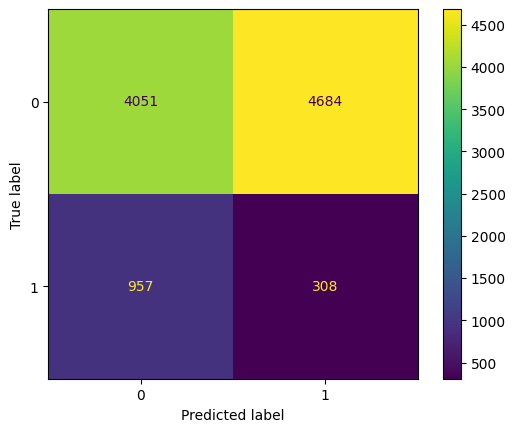

In [23]:
from copy import deepcopy
from sklearn.metrics import ConfusionMatrixDisplay, adjusted_rand_score, confusion_matrix
import numpy as np

#matrice de confusion
df_n = df.copy()
df_n['category'] = pd.factorize(df['category'])[0]
y_true = df_n['category']
y_pred = kmeans.labels_
m = confusion_matrix(y_true, y_pred)
l=df_n['category'].unique()
disp = ConfusionMatrixDisplay(confusion_matrix=m, display_labels=l)
disp.plot()

On obtient un score de 0.016, ce qui signifie que les clusters ne sont pas similaires aux vraies classes
On n'a donc pas réussi à prédire la variable "category" en fonction des autres variables. 

### Clustering spectral

In [24]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score


# Create an instance of the model
spectral = SpectralClustering(n_clusters=2, affinity="nearest_neighbors")
spectral.fit(df_traite)
spectral.labels_
print(df_traite)


/Users/aurelie/Library/CloudStorage/OneDrive-Personal/Travail école/2023 - 2024/Analyse de donnees/.venv/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


      squareMeters  numberOfRooms  hasYard  hasPool    floors  cityCode  \
0         0.755020       0.020202      0.0      1.0  0.626263  0.093747   
1         0.807547       0.383838      1.0      1.0  0.979798  0.393977   
2         0.556731       0.575758      0.0      1.0  0.181818  0.344712   
3         0.322560       0.464646      0.0      0.0  0.050505  0.279500   
4         0.704034       0.181818      1.0      1.0  0.898990  0.380610   
...            ...            ...      ...      ...       ...       ...   
9995      0.016385       0.888889      0.0      1.0  0.040404  0.731666   
9996      0.443539       0.282828      1.0      1.0  0.111111  0.346203   
9997      0.838274       0.020202      0.0      0.0  0.686869  0.809705   
9998      0.590001       0.696970      0.0      0.0  0.959596  0.558809   
9999      0.013522       0.838384      0.0      0.0  0.484848  0.184182   

      cityPartRange  numPrevOwners      made  isNewBuilt  hasStormProtector  \
0          0.222222 

In [25]:
#Donne le meilleur algo de clustering
# on détermine un algo pour qu'il puisse nous ressortir le nombre de clusters idéal 
def bestAlgoClust (df) : 
    c=[]
    s=[]
    for k in range(2,df.shape[1]):
        c.append(k)
        s.append(silhouette_score(df,SpectralClustering(c[k-2]).fit_predict(df)))
    return c[s.index(max(s))]
        

c = bestAlgoClust(df_traite)        


In [26]:
spectral = SpectralClustering(n_clusters=c,affinity='nearest_neighbors')
spectral.fit(df_traite)

/Users/aurelie/Library/CloudStorage/OneDrive-Personal/Travail école/2023 - 2024/Analyse de donnees/.venv/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


SpectralClustering(affinity='nearest_neighbors', n_clusters=2)

#### Stratégie nearest_neighbors

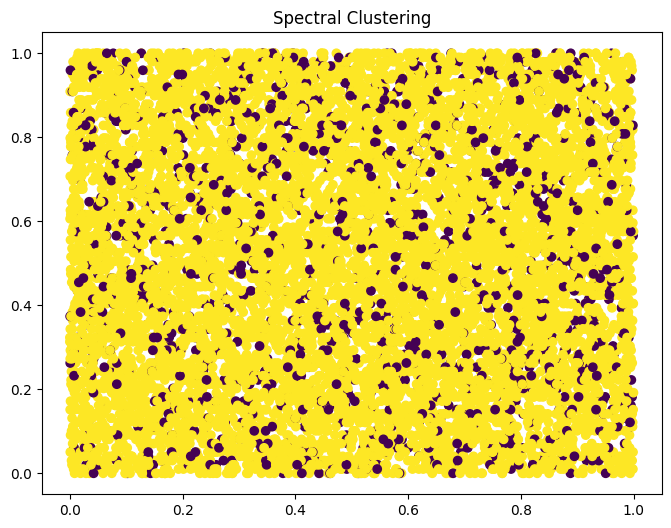

In [27]:
#afficher le spectral clustering
# Plot the data
f = plt.figure(figsize=(8,6))
plt.title('Spectral Clustering')
plt.scatter(df_traite.iloc[:,0],df_traite.iloc[:,1],c=spectral.labels_)
plt.show()

En choisissant la stratégie nearest_neighbors, on se rend compter que ce n'est pas une stratégie optimale pour étudier/interpréter des données.
Nous n'avons pas de cluster correctement défini pour déterminer notre variable 'category'

### Stratégie RBF

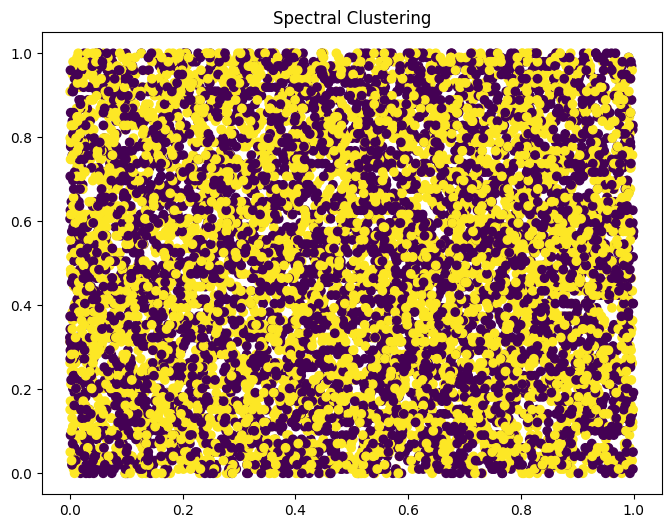

In [28]:
spectral = SpectralClustering(n_clusters=c,affinity='rbf')
spectral.fit(df_traite)

f = plt.figure(figsize=(8,6))
plt.title('Spectral Clustering')
plt.scatter(df_traite.iloc[:,0],df_traite.iloc[:,1],c=spectral.labels_)
plt.show()

Le clusturing RBF n'est pas adapté. Nous retrouvons un résultat non défini, les données sont mélangées. 
On peut se dire que le clustering spectral n'est pas adapté à nos données. 
Peut-être avons-nous trop de données. 

### Clustering hiérarchique 

In [29]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

In [30]:
hclust = AgglomerativeClustering(linkage='complete')
hclust.fit(df_traite)

AgglomerativeClustering(linkage='complete')

In [31]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram

from sklearn.cluster import AgglomerativeClustering

def plotdendrogram(model, **kwargs):
    
    counts = np.zeros(model.children_.shape[0])
    nsamples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < nsamples:
                current_count += 1  
            else:
                current_count += counts[child_idx - nsamples]
        counts[i] = current_count

   
    incrementaldistances = np.arange(1, model.children_.shape[0] + 1)

    linkagematrix = np.column_stack([model.children_, incrementaldistances, counts]).astype(float)

    dendrogram(linkagematrix, **kwargs)


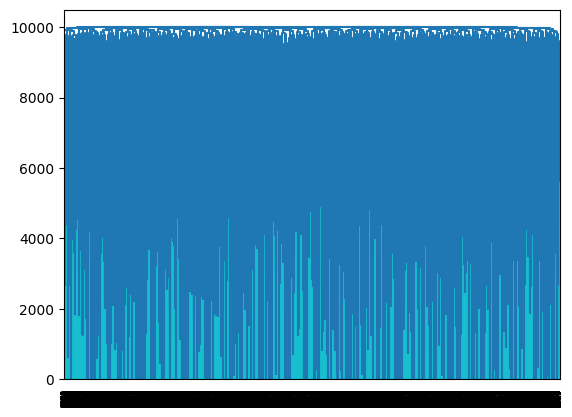

In [32]:
plotdendrogram(hclust)

Le dendogramme que nous obtenus est beaucoup trop denses pour pouvoir visualiser correctement nos données. 

In [33]:
#Donne le meilleur algo de clustering
def bestAlgoClust (df) : 
    c=[]
    s=[]
   
    for k in range(2,(df.shape[1])):
        
        c.append(k)
        
        s.append(silhouette_score(df,AgglomerativeClustering(c[k-2]).fit_predict(df)))
        
    return c[s.index(max(s))]

c = bestAlgoClust(df_traite) 


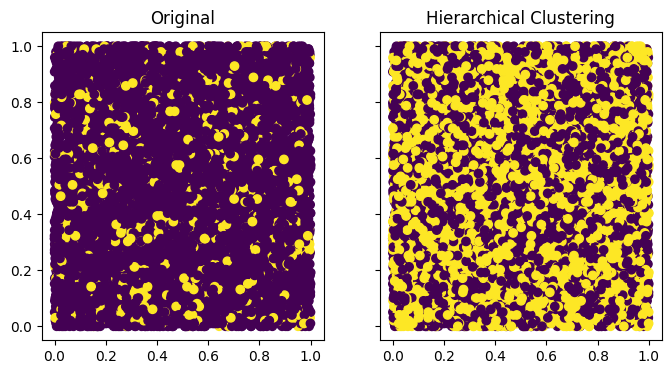

In [42]:
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(8,4))
data = df_traite
df_n = df.copy()
df_n['category'] = pd.factorize(df['category'])[0]
labels = df_n['category']
ax1.set_title("Original")
ax1.scatter(data.iloc[:,0],data.iloc[:,1],c=labels)

ax2.set_title('Hierarchical Clustering')
ax2.scatter(data.iloc[:,0],data.iloc[:,1],c=hclust.labels_)

plt.show()

Lé résultat obtenu avec le clustering hiérarchique est plus lisible que pour les précédentes stratégies de clustering utilisées. Cependant nous ne pouvons pas déterminer 

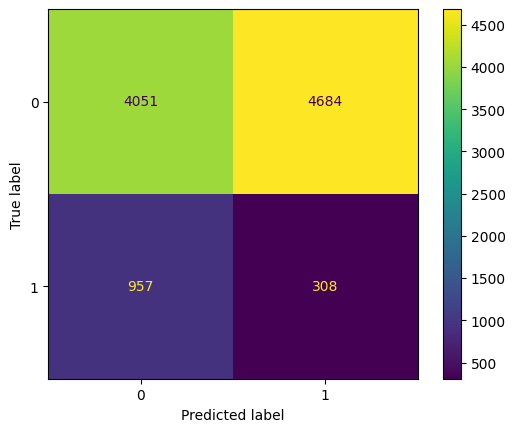

In [43]:
#matrice de confusion
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix


df_n = df.copy()
df_n['category'] = pd.factorize(df['category'])[0]
y_true = df_n['category']
y_pred = hclust.labels_
m = confusion_matrix(y_true, y_pred)
l=df_n['category'].unique()
disp = ConfusionMatrixDisplay(confusion_matrix=m, display_labels=l)
disp.plot()

In [45]:
from sklearn.metrics import adjusted_rand_score
import numpy as np


ari = adjusted_rand_score(df['category'], hclust.labels_)

print(ari)

0.016390356013023216


Grâce au score que nous retrouvons : environ 0.016, on sait que le rapprochement entre les données et nos clusters est aléatoire. Par conséquent, ce n'est pas fiable. 

### Réduction de donnée ACP

In [47]:

from sklearn.preprocessing import StandardScaler

df = df_traite

scaler = StandardScaler()

scaler.fit(df)

data_scaled = scaler.transform(df)

In [48]:
from sklearn.decomposition import PCA

pca = PCA(n_components=18) 

pca.fit(data_scaled)
data_pca = pca.transform(data_scaled)

In [50]:

print("Explained variance")
print(pca.explained_variance_)

n = len(data_pca) 
corrected_variance = (n/(n-1))*pca.explained_variance_
print("\nCorrected variance")
print(corrected_variance)

Explained variance
[2.00566986e+00 1.86756283e+00 1.07697221e+00 1.04694574e+00
 1.03570872e+00 1.03141240e+00 1.01411594e+00 1.00461517e+00
 9.97795331e-01 9.93771254e-01 9.85045123e-01 9.79491036e-01
 9.66202704e-01 9.61751980e-01 9.60095722e-01 9.40724404e-01
 1.33919520e-01 2.17313205e-07]

Corrected variance
[2.00587045e+00 1.86774961e+00 1.07707992e+00 1.04705045e+00
 1.03581230e+00 1.03151555e+00 1.01421736e+00 1.00471564e+00
 9.97895121e-01 9.93870641e-01 9.85143637e-01 9.79588995e-01
 9.66299334e-01 9.61848165e-01 9.60191741e-01 9.40818486e-01
 1.33932913e-01 2.17334938e-07]


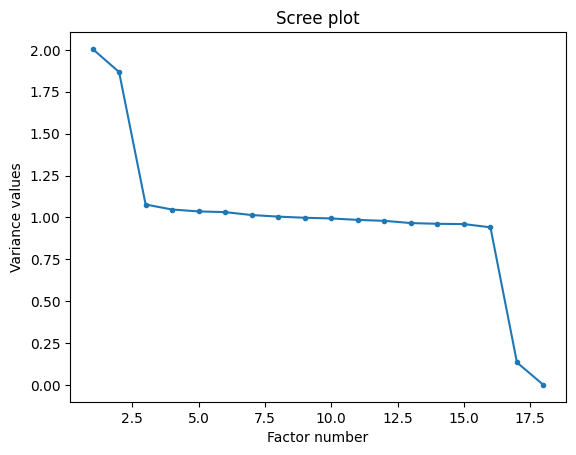

In [51]:
# plot the explained variance of each component
p = data_pca.shape[1] 
plt.plot(np.arange(1,p+1),corrected_variance, marker='.')
plt.title("Scree plot")
plt.ylabel("Variance values")
plt.xlabel("Factor number")
plt.show()

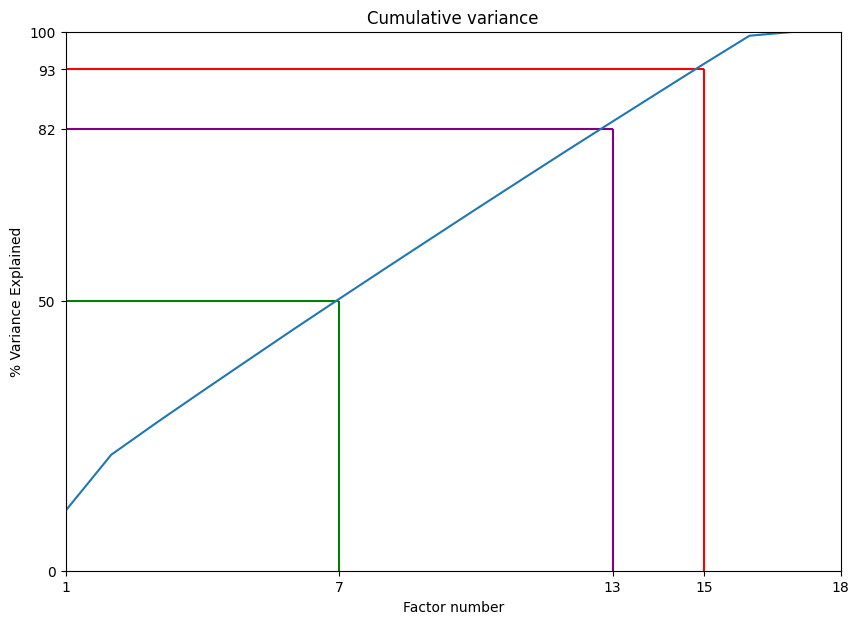

In [52]:
pca.explained_variance_ratio_*100
cumulative_var = np.cumsum(pca.explained_variance_ratio_*100)
cumulative_var
# plot the cumulative variance
plt.figure(figsize=(10,7))
plt.title("Cumulative variance")
plt.ylabel('% Variance Explained')
plt.xlabel('Factor number')

plt.hlines(y=93.0, xmin=0, xmax=15, color='red')
plt.vlines(x=15.0, ymin=0, ymax=93,color='red')

plt.hlines(y=82.0,xmin=0, xmax=13, color='purple')
plt.vlines(x=13.0, ymin=0, ymax=82, color='purple')

plt.hlines(y=50.0, xmin=0, xmax=7, color='green')
plt.vlines(x=7.0,ymin=0, ymax=50, color='green')

plt.ylim(0,100)
plt.xlim(1,18)
plt.yticks([0,50,82,93,100])
plt.xticks([1,7,13,15,18])
plt.style.context('seaborn-whitegrid')
plt.plot(np.arange(1,p+1),cumulative_var)
plt.show()


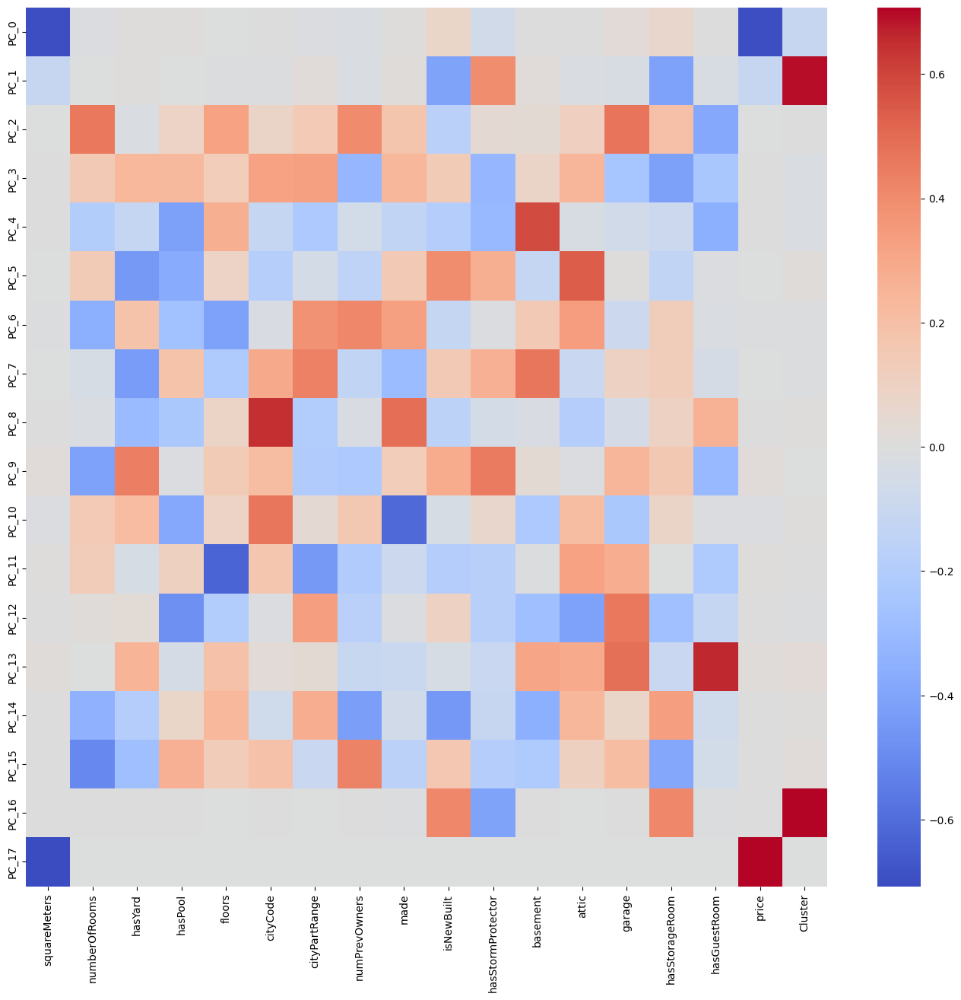

In [53]:
data = df_traite
components = pd.DataFrame(pca.components_, columns=data.columns, index=[f"PC_{i}" for i in range(len(pca.components_))])

plt.figure(figsize=(17,15))
sns.heatmap(components,cmap='coolwarm',)
plt.show()

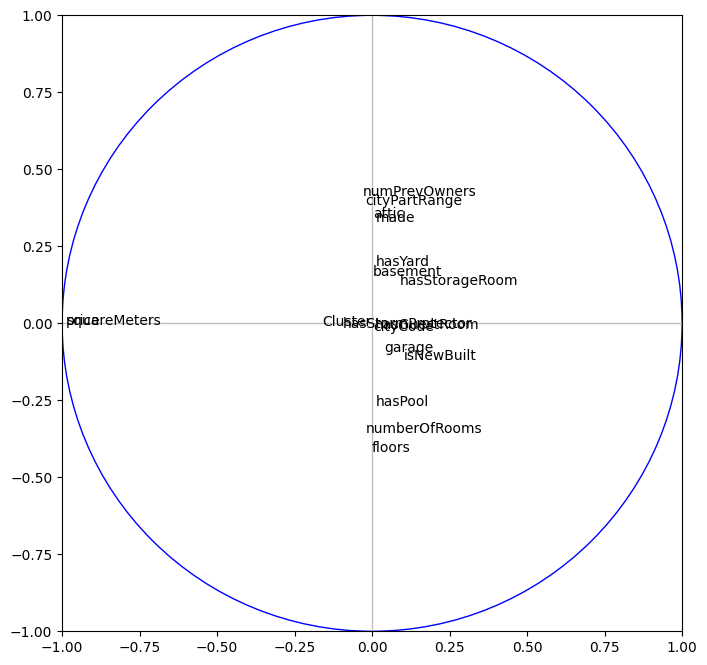

In [54]:
#analyse des variables a garder avec le cercle de corélation 

sqrt_cor_var = np.sqrt(corrected_variance)
corvar = np.zeros((p,p))
for k in range(p):
 corvar[:,k] = pca.components_[k,:] * sqrt_cor_var[k]
 

# Correlation circle
fig, axes = plt.subplots(figsize=(8,8))
axes.set_xlim(-1,1)
axes.set_ylim(-1,1)
# Print the labels (variable names)
composanteA = 0
composanteB = 6
for j in range(p):
     plt.annotate(data.columns[j],(corvar[j,composanteA],corvar[j,composanteB]))

# Add the axes
plt.plot([-1,1],[0,0],color='silver',linestyle='-',linewidth=1)
plt.plot([0,0],[-1,1],color='silver',linestyle='-',linewidth=1)

# Add a circle
cercle = plt.Circle((0,0),1,color='blue',fill=False)
axes.add_artist(cercle)
# Print the correlation circle
plt.show()

On décide de réduire ma dataset de 13 élement. Cependant, il serait plus intéressant d'envisager de garder toutes les variables car la réduction de dimension n'est pas assez intéréssante. 


### Liens de corélation ACC

In [77]:
#Traitement numérique
# Step 2.a: fit the imputer instance to the data
missing_values = df_v2.isnull().sum()
imputer = SimpleImputer(missing_values= np.nan , strategy='mean')
df_numeric_traite = pd.DataFrame (imputer.fit_transform(df_v2), columns=df_v2.columns)
# Step 2.b: Transform the dataset by replacing the missing values
imputer.fit(df_numeric_traite)

#normaliser les données
# 1. Min-Max Normalization using scikit-learn
min_max_scaler = MinMaxScaler()
df_numeric_traite = pd.DataFrame(min_max_scaler.fit_transform(df_numeric_traite), columns=df_numeric_traite.columns)

print(df.columns)

#traitement nominal 
cat = pd.factorize(df.columns)
df_nominal = pd.DataFrame(cat[0])
df_traite = df_numeric_traite
df_traite['category'] = df_nominal

Index(['squareMeters', 'numberOfRooms', 'hasYard', 'hasPool', 'floors',
       'cityCode', 'cityPartRange', 'numPrevOwners', 'made', 'isNewBuilt',
       'hasStormProtector', 'basement', 'attic', 'garage', 'hasStorageRoom',
       'hasGuestRoom', 'price', 'Cluster'],
      dtype='object')


In [78]:
data_merged = df_traite
scaler = StandardScaler()
x_scaled = scaler.fit_transform(data_merged)
data_scaled = pd.DataFrame(x_scaled, columns=data_merged.columns)
data_scaled.head()

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price,category
0,0.891562,-1.643518,-1.017554,1.006421,0.440453,-1.408453,-0.874027,0.867593,-0.052484,-0.998202,1.0002,-0.250333,1.374130,1.537488,-1.006018,0.631373,0.891687,-1.638356
1,1.073956,-0.394180,0.982749,1.006421,1.652041,-0.373880,0.866993,0.167441,1.021904,1.001802,-0.9998,-0.479772,-0.895592,-1.622370,0.994018,-0.942810,1.074814,-1.445608
2,0.203033,0.265193,-1.017554,1.006421,-1.082685,-0.543643,0.170585,0.867593,1.666537,-0.998202,-0.9998,-0.728678,1.321265,-1.595657,0.994018,1.261046,0.201994,-1.252861
3,-0.610092,-0.116549,-1.017554,-0.993620,-1.532703,-0.768361,1.563401,-0.532710,0.699588,-0.998202,1.0002,-1.520589,0.730080,-0.740816,-1.006018,-0.627973,-0.611997,-1.060113
4,0.714521,-1.088257,0.982749,1.006421,1.375106,-0.419941,-0.874027,0.517517,-1.664066,1.001802,-0.9998,1.182616,-0.898010,-0.996505,0.994018,-0.313136,0.716512,-0.867365


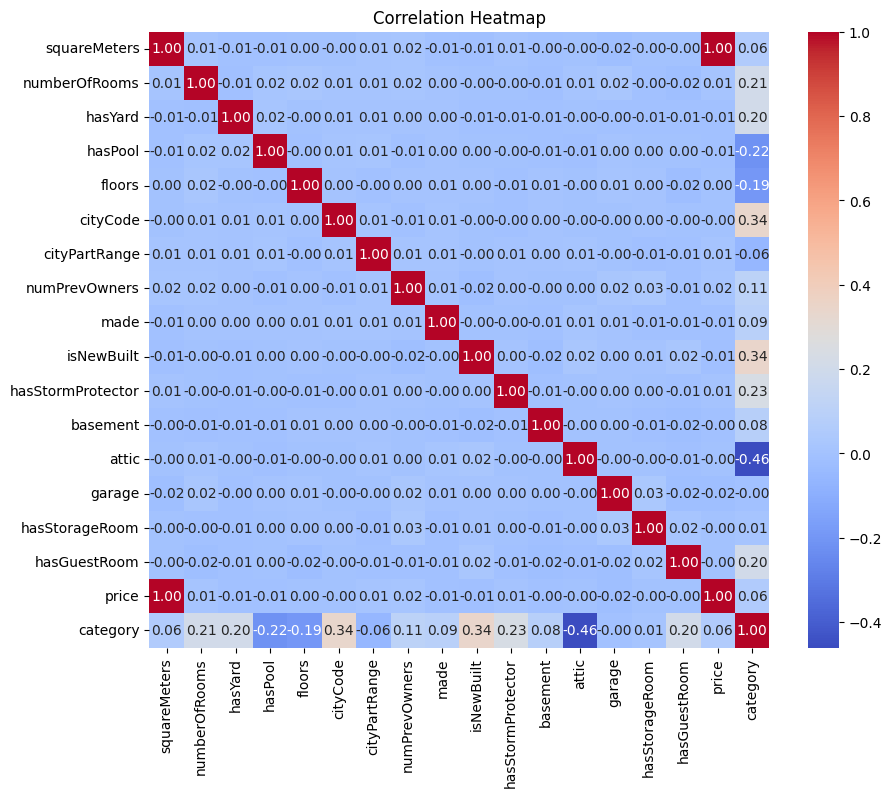

In [79]:
# Calculate correlation matrix
corr = data_scaled.corr()

# Create heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

Nous pouvons remarquer avec notre matrice de correlation que le prix et le metre carré sont tres fortement corellé. De meme avec la catégory de maison et le fait qu'elle est une piscine. 
 

In [80]:
#on décide d'étudier ces 4 variables
X_beak = data_scaled[["price", "squareMeters"]]
X_body = data_scaled[["category", "hasPool"]]

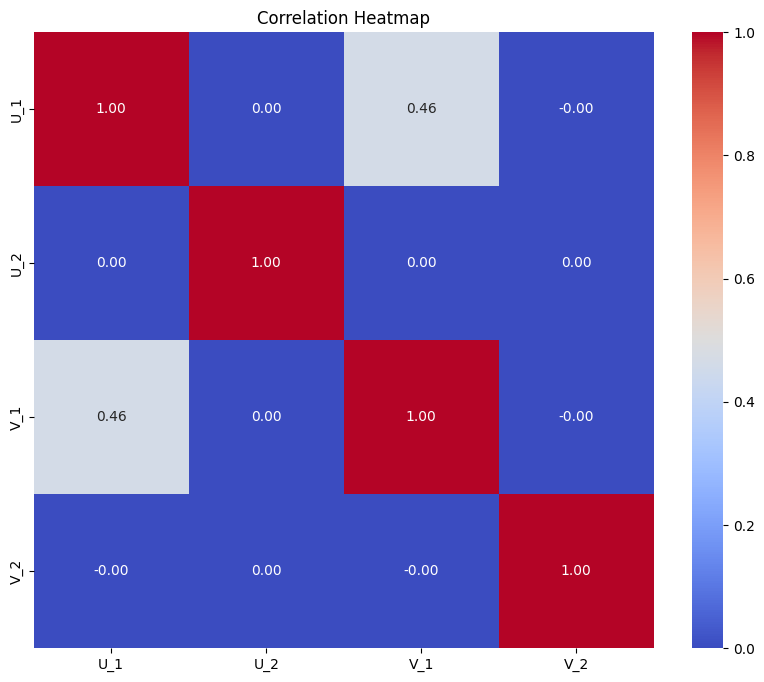

In [86]:
from sklearn.cross_decomposition import CCA 

#compléter les valeurs nulles 
nulles = SimpleImputer(strategy= 'mean')
y = imputer.fit_transform(X_body)

cca = CCA(n_components=2, scale=False)
cca.fit(X_beak, y)

U_, V_ = cca.transform(X_beak, y)
data_cca = pd.DataFrame({"U_1": U_[:,0], "U_2": U_[:,1],
                         "V_1": V_[:,0], "V_2": V_[:,1]})
# Calculate correlation matrix
corr_cca = data_cca.corr()

# Create heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(corr_cca, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

L'algorithme ACC a confirmé la forte corrélation entre le prix et la superfie d'une maison (corrélation positive). Ce qui n'est pas le cas avec la catégory d'une maison et le fait qu'elle ait une piscine. (faible score de corrélation)

In [87]:
cca.coef_

array([[ 13.14433791, -11.90101853],
       [ -6.31629396,   5.64275903]])

In [88]:
cca.intercept_

array([ 0.00000000e+00, -4.97379915e-18])

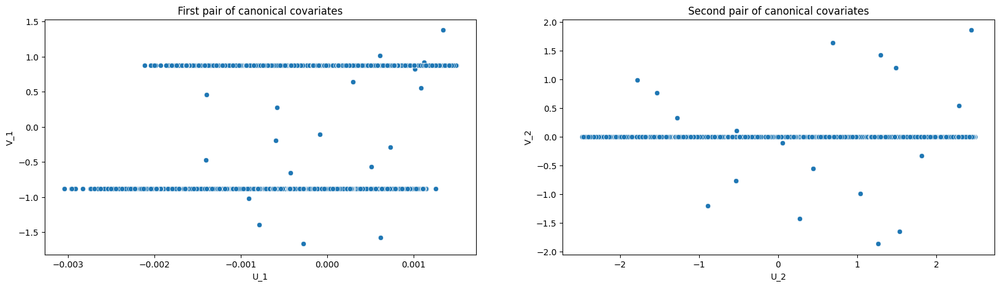

In [89]:
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
sns.scatterplot(x="U_1",
                y="V_1", 
                data=data_cca)
plt.title('First pair of canonical covariates')

plt.subplot(1,2,2)
sns.scatterplot(x="U_2",
                y="V_2",
                data=data_cca)
plt.title('Second pair of canonical covariates')
plt.show()

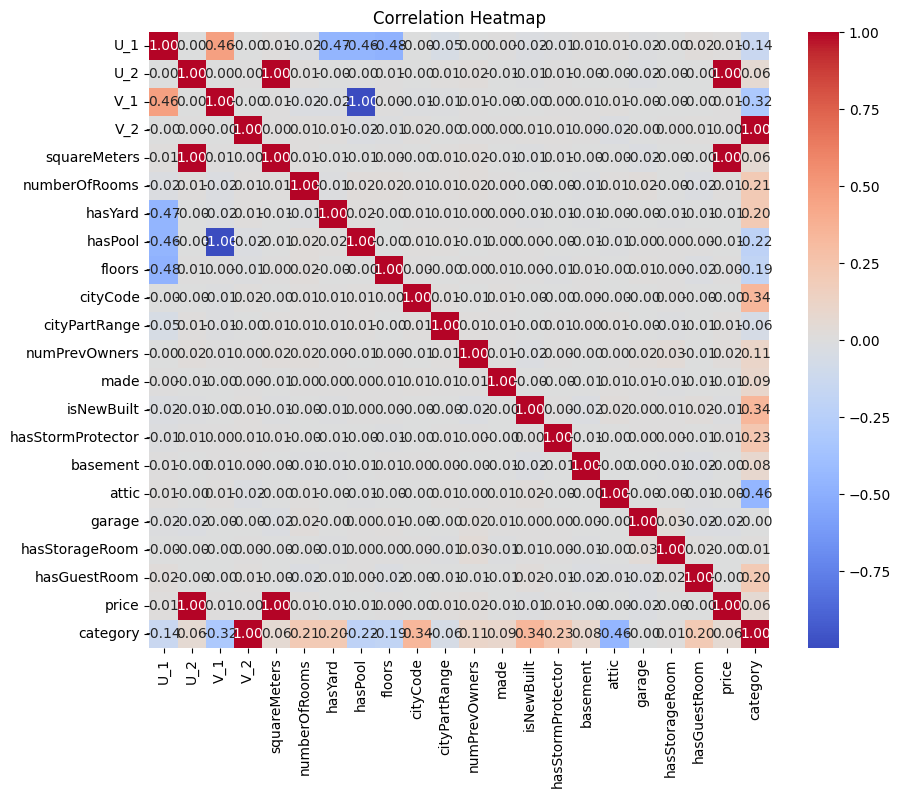

In [90]:
# Concatenate the two DataFrames
cc_var = pd.concat((data_cca, data_scaled), axis=1)

# Calculate correlation matrix
corr_cc_var = cc_var.corr(method="pearson")

# Create heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(corr_cc_var, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

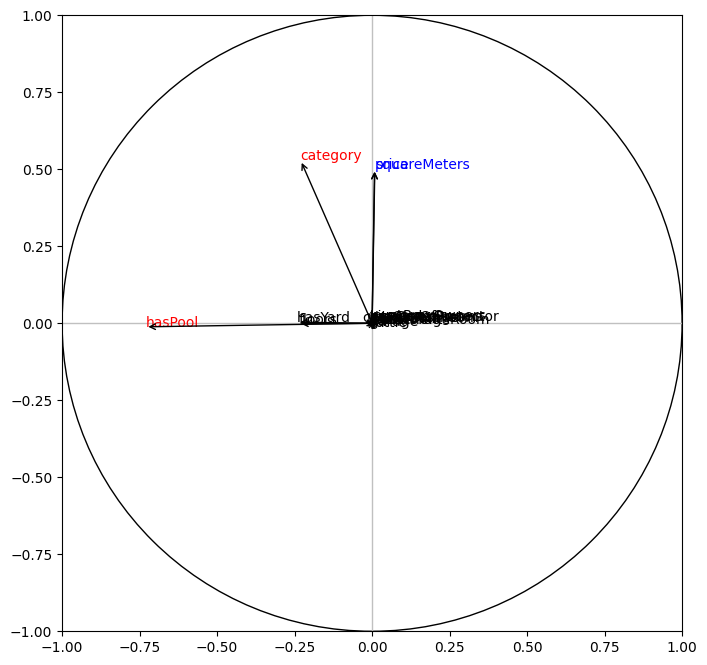

In [91]:
fig, axes = plt.subplots(figsize=(8,8))
axes.set_xlim(-1,1)
axes.set_ylim(-1,1)

# Print the labels (variable names)
for col in data_scaled:
    if col in X_beak.columns: color="b"
    elif col in X_body.columns: color="r"
    else: color = "black"

    # Get coordinates in the two canonical components  
    coord_horizontal = .5 * (corr_cc_var.at["U_1",col] + corr_cc_var.at["V_1",col])
    coord_vertical = .5 * (corr_cc_var.at["U_2",col] + corr_cc_var.at["V_2",col])
    plt.annotate(col,(coord_horizontal,coord_vertical), color=color)
    axes.annotate("", xy=(coord_horizontal,coord_vertical), xytext=(0, 0),arrowprops=dict(arrowstyle="->", color="black"))

# Add the axes
plt.plot([-1,1],[0,0],color='silver',linestyle='-',linewidth=1)
plt.plot([0,0],[-1,1],color='silver',linestyle='-',linewidth=1)

# Add a circle
cercle = plt.Circle((0,0),1,color='black',fill=False)
axes.add_artist(cercle)
# Print the correlation circle
plt.show()

[]

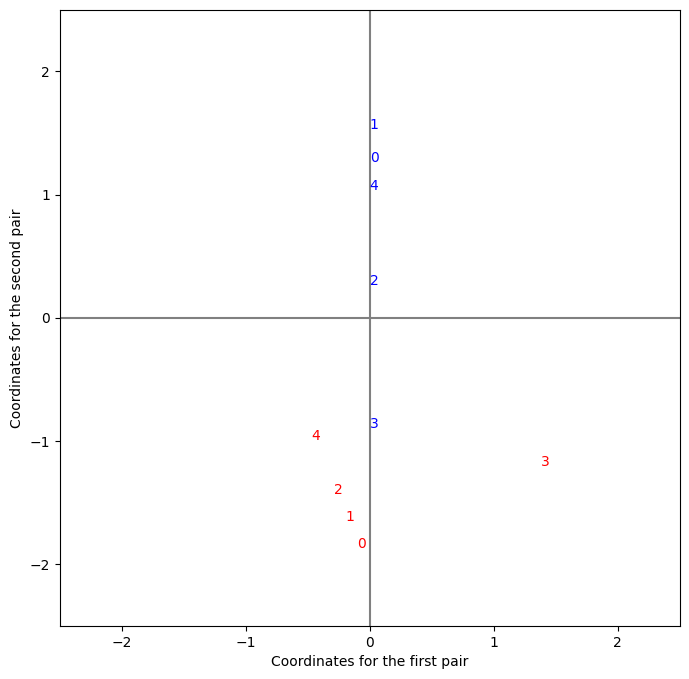

In [92]:
from matplotlib.pyplot import figure
fig, axes = plt.subplots(figsize=(8,8))

# We can plot the first 5 samples in the dataset
# by their coordinates in the first group of variables (in blue)
# and their coordinates in the second group of variables (in red)
# to see how far the two groups place the same sample.
for i in range(5):
    plt.annotate(i, (U_[i,0],U_[i,1]), color="b")
    plt.annotate(i, (V_[i, 0],V_[i, 1]), color="r")

plt.xlabel('Coordinates for the first pair')
plt.ylabel('Coordinates for the second pair')

# Modify xlim and ylim out zoom in and out of the figure
coord = 2.5
plt.xlim(-coord,coord)
plt.ylim(-coord,coord)

plt.hlines(0, -coord, coord, color="grey")
plt.vlines(0, -coord, coord, color="grey")

plt.plot()